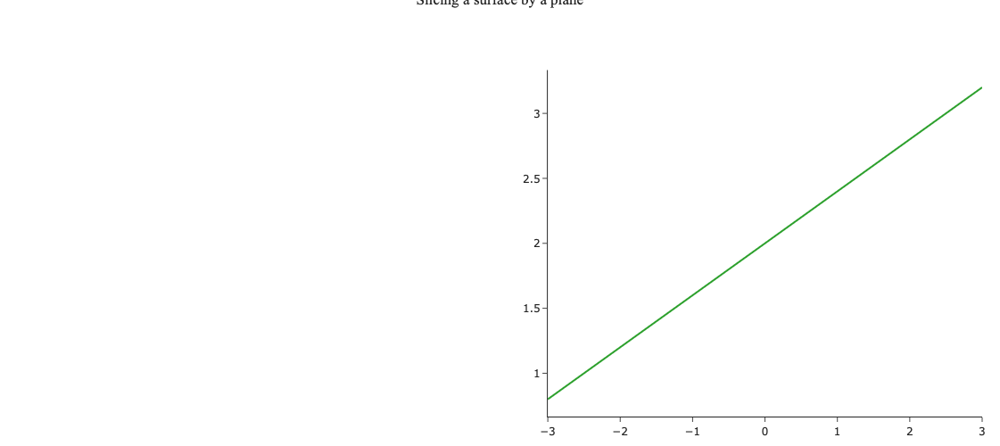

In [3]:
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots

def compose1(f, c):
    # compose a function of two variable with the constant function phi(x)=c:  f(phi(x), y) 
    g = lambda y: f(c, y)
    return g

def compose2 (f, c):
     # compose a function of two variable with the constant function phi(x)=c: f(x, phi(x))
    g = lambda x: f(x, c)
    return g

def composefh(f, h):
    # compose the function f(x,y) with y=h(x):
    g = lambda x: f(x, h(x))
    return g

def get_curve(M, v, f):
    # M a 3-list or array- represents a point in the plane of intersection: M=[x0, y0, 0]
    # v= [a, b, 0] direction contained in the plane along with w=[0,0,1]
    # f function of two variables that define the equation of the surfae z=f(x,y)
    # returns the function g that defines the equation y=g(x) of the curve of intersection
    
    x0, y0, _ =M
    a, b, _ = v 
    if a == 0 and b != 0:
        g = compose1(f, x0)
        id =1
    elif a != 0 and b==0:
        g =compose2(f, y0)
        id=2
    else:
        h = lambda x: y0+b*(x-x0)/a
        g = composefh(f, h)
        id=3
    return g, id    

# Function that returns the X, Y, Z-array defining the section plane as a Plotly surface
def get_plane(M, v,   id, xx, yy, zz):
    
    # M point contained by the plane
    # v direction included in plane (orthogonal to w=[0, 0, 1])
    # id - is the id returned by the function get_curve; the plane arrays, X, Y, Z,  are defined according to id value
    x0, y0, _= M
    a, b, _= v
  
    if id == 1:
        Y, Z = np.meshgrid(yy, zz)
        X = x0*np.ones(Y.shape)
    elif id == 2 :
        X, Z = np.meshgrid(xx, zz)
        Y = y0*np.ones(X.shape)
    elif id == 3 :
        X, Z = np.meshgrid(xx, zz)
        Y = y0+b*(X-x0)/a   
    else:
        pass
    return X, Y, Z
        

# Define the surface to be cut by a plane:
f_surf = lambda x, y: 2+ 0.1*x + 0.3*y + 0.1*x**2 -0.3*x*y + 0.2*y**2

# and data to instantiate the Plotly Surface:
xx = np.linspace(-3, 3, 300)
yy = np.linspace(-3, 3, 300)
x,y = np.meshgrid(xx, yy)
z = f_surf(x, y)
zz = np.linspace(1, 5, 100)
#zz = np.linspace(z.min(), z.max(), 100)

# define the elements to get the section plane equation
M = [1, 1, 0]  # a point in the plane
v = [1, 1, 0] # a direction contained in the plane
g, id = get_curve(M, v, f_surf)
X, Y, Z =  get_plane(M, v,   id, xx, yy, zz)

#Define subplots of 1 row and two columns. In the subplot (1,1) draw the surface of equation z=f(x,y) and the cutting plane
#perpendicular on the plane z=0, while in (1,2) the resulted curve.

fig = make_subplots(
     rows=1, cols=2,
     horizontal_spacing=0.1,
     specs=[[{"type": "scene"}, {"type": "xy"}]])
fig.add_trace(go.Surface(x=x,
                          y=y, 
                          z=z,
                          colorscale="Viridis",
                          showscale=False), row=1, col=1)
fig.add_trace(go.Surface(x=X, y=Y, z=Z, 
                         colorscale= [[0, "rgb(254, 254, 254)"],
                                      [1, "rgb(254, 254, 254)"]],
                         showscale=False,
                         opacity =0.65), row=1, col=1)
fig.add_trace(go.Scatter(x= xx, y = g(xx), mode="lines"), row=1, col=2)    
fig.update_layout(title_text="Slicing a surface by a plane",
                  title_x=0.5,
                  scene= {"camera": {"eye": {"x": 1.65, "z":1.25}}},
                  width=1000, height=500, yaxis = {"domain":  [0, 0.85]}
              )    

fig.update_layout(
    scene = dict(
        xaxis = dict(nticks=5, range=[-2,2],),
                     yaxis = dict(nticks=5, range=[-2,2],),
                     zaxis = dict(nticks=5, range=[1,7],),),
    width=700,
    margin=dict(r=20, l=10, b=10, t=10))

fig.update_layout(template='simple_white')
fig.update_layout(title_font_family='Times New Roman')
fig.update_layout(legend_font_family='Times New Roman') 

In [2]:
import plotly.io as pio
pio.write_json(fig, "testing.plotly.json")